<a href="https://colab.research.google.com/github/dyjs-js/etg2022WISET/blob/image_crawling/0829_es_custom_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Yolov5

In [1]:
import yaml
import torch
from IPython.display import Image, clear_output

In [2]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 12057, done.
remote: Total 12057 (delta 0), reused 0 (delta 0), pack-reused 12057
Receiving objects: 100% (12057/12057), 12.52 MiB | 20.92 MiB/s, done.
Resolving deltas: 100% (8297/8297), done.


In [3]:
%cd yolov5

/content/yolov5


In [19]:
%pip install -qr requirements.txt

In [4]:
print(f"Torch: {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'}")

Torch: 1.12.1+cu113 (Tesla P100-PCIE-16GB


# coco dataset 학습된 모델 사용이 아닌 직접 목적에 맞는 data 학습 시키기

## roboflow의 electricscooter dataset 가져와서 학습 시키기


## dataset 가져오기

In [5]:
%mkdir /content/yolov5/electricscooter
%cd /content/yolov5/electricscooter

!curl -L "https://app.roboflow.com/ds/fQjM9u9xQ9?key=g2OUUrXWPJ" > electricscooter.zip; unzip electricscooter.zip;

/content/yolov5/electricscooter
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0    208      0  0:00:04  0:00:04 --:--:--   291
100 7572k  100 7572k    0     0  1344k      0  0:00:05  0:00:05 --:--:--  305M
Archive:  electricscooter.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/113_jpg.rf.7d443b49c94404b1317086e892744867.jpg  
 extracting: test/images/114_jpg.rf.26cbba82bd93a46d301bc24e67899bf9.jpg  
 extracting: test/images/130_jpg.rf.35a9e56f6184b5643f682d7322040c6b.jpg  
 extracting: test/images/139_jpg.rf.3803bda9d3ff436650fcc304c76c08fa.jpg  
 extracting: test/images/141_jpg.rf.a59d78cb27c6ff0d8dad920ca77e4de1.jpg  
 extracting: test/images/165_jpg.rf.a62d4699da98166d1a7d4e11e3faf137.jpg  
 extracting: 

In [6]:
from glob import glob

train_img_list = glob('/content/yolov5/electricscooter/train/images/*.jpg')
test_img_list = glob('/content/yolov5/electricscooter/test/images/*.jpg')
valid_img_list = glob('/content/yolov5/electricscooter/valid/images/*.jpg')

print(len(train_img_list),len(test_img_list),len(valid_img_list))

146 22 41


In [9]:
import yaml

with open('/content/yolov5/electricscooter/train.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open('/content/yolov5/electricscooter/test.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open('/content/yolov5/electricscooter/val.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

In [10]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals()))

In [12]:
%cat /content/yolov5/electricscooter/data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['electricscooter']

In [13]:
%%writetemplate /content/yolov5/electricscooter/data.yaml

train: ./electricscooter/train/images
test: ./electricscooter/test/images
val: ./electricscooter/valid/images

nc: 1
names: ['electricscooter']

In [14]:
%cat /content/yolov5/electricscooter/data.yaml


train: ./electricscooter/train/images
test: ./electricscooter/test/images
val: ./electricscooter/valid/images

nc: 1
names: ['electricscooter']


# 모델구성

In [15]:
import yaml

with open("/content/yolov5/electricscooter/data.yaml",'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [21]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]


In [22]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

# 학습(Training)
- img : 입력 이미지 크기 정의
- batch : 배치 크기 결정
- epochs : 학습 기간 개수 정의
- data : 모델 구성 지정
- weights : 가중치에 대한 경로 지정
- name : 결과 이름
- nosave : 최종 체크포인트만 저장
- cache : 빠른 학습을 위한 이미지 캐시

In [25]:
%%time
%cd /content/yolov5/

!python train.py --img 640 --batch 32 --epochs 500 --data ./electricscooter/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name es_results --cache 

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./electricscooter/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=500, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=es_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-66-ge57275a Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=

# 학습이 잘 되었는지 tensorboard로 확인

In [26]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 465), started 0:29:37 ago. (Use '!kill 465' to kill it.)

<IPython.core.display.Javascript object>

## 결과물 확인

In [27]:
!ls /content/yolov5/runs/train/es_results4/

confusion_matrix.png				   R_curve.png
events.out.tfevents.1661776420.5b36feb3f393.548.0  results.csv
F1_curve.png					   results.png
hyp.yaml					   train_batch0.jpg
labels_correlogram.jpg				   train_batch1.jpg
labels.jpg					   train_batch2.jpg
opt.yaml					   val_batch0_labels.jpg
P_curve.png					   val_batch0_pred.jpg
PR_curve.png					   weights


## 학습한 결과 확인

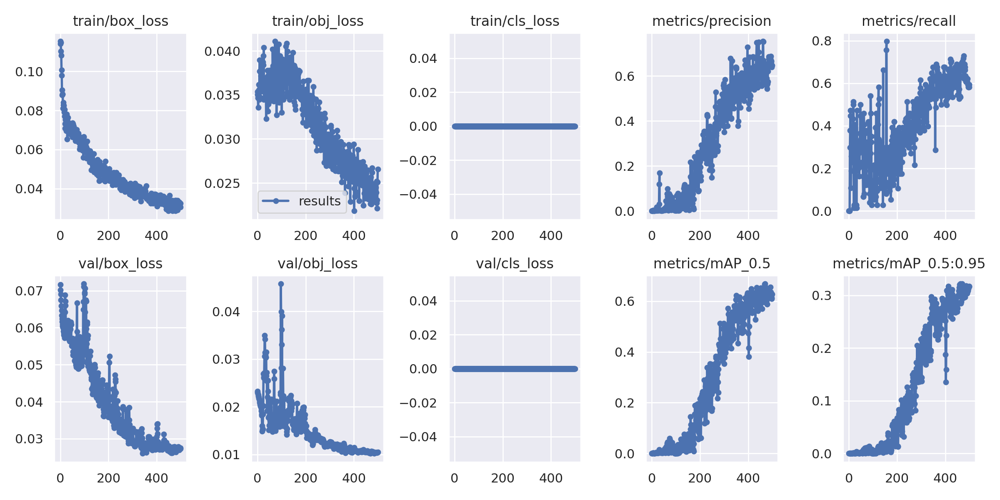

In [28]:
Image(filename='/content/yolov5/runs/train/es_results4/results.png',width=1000)

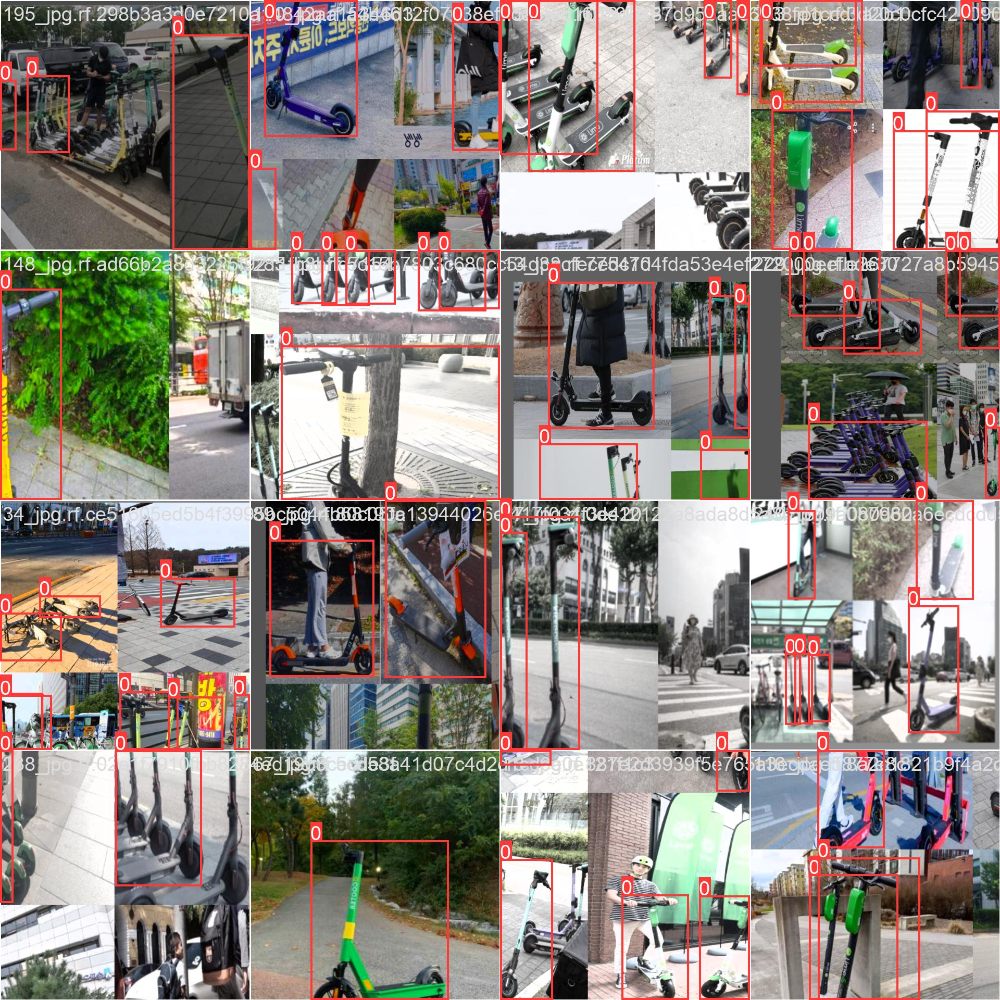

In [30]:
Image(filename='/content/yolov5/runs/train/es_results4/train_batch0.jpg',width=1000) # train에서 사용한 이미지들에서 찾은 결과

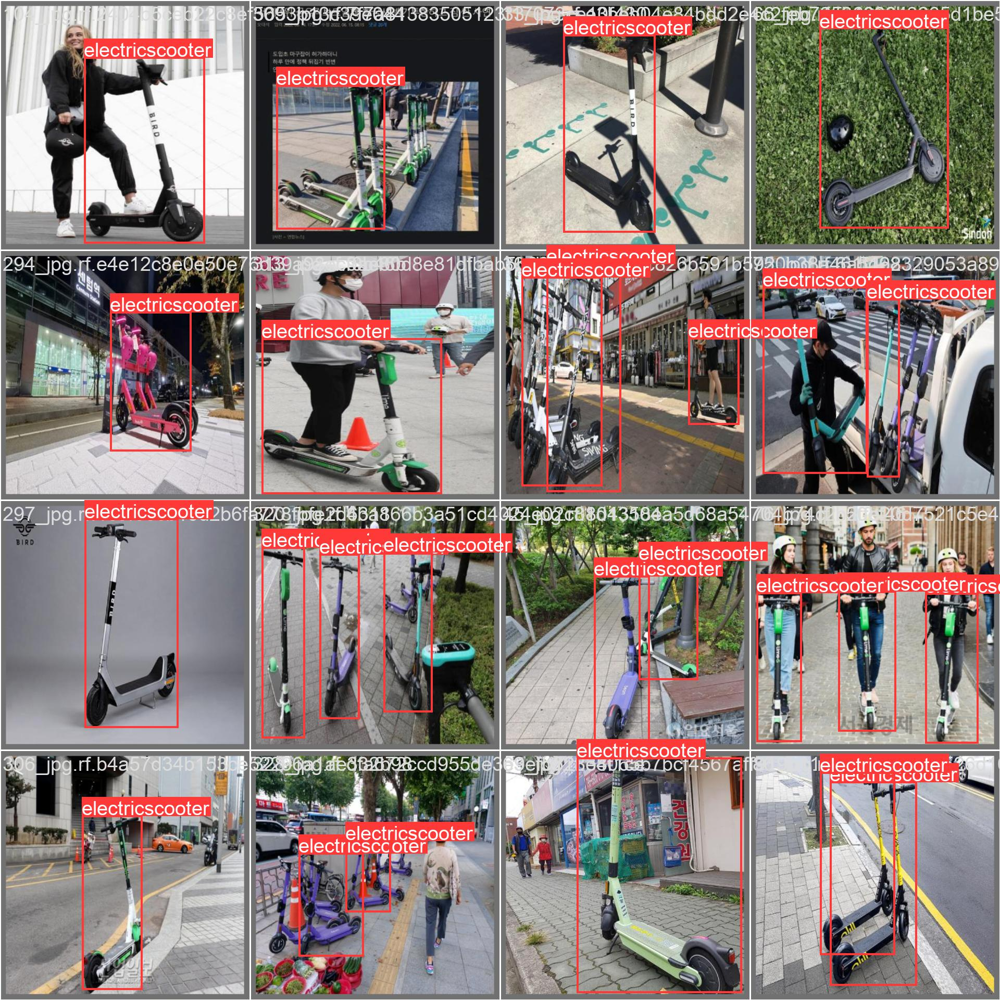

In [33]:
Image(filename='/content/yolov5/runs/train/es_results4/val_batch0_labels.jpg',width=1000) # validation 결과 label 붙여서 보여줌

# 검증(Validation)

In [36]:
%cd /content/yolov5

/content/yolov5


In [37]:
!python val.py --weights runs/train/es_results4/weights/best.pt --data ./electricscooter/data.yaml --img 640 --iou 0.65 --half 

val: data=./electricscooter/data.yaml, weights=['runs/train/es_results4/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.2-66-ge57275a Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/yolov5/electricscooter/valid/labels.cache' images and labels... 41 found, 0 missing, 0 empty, 0 corrupt: 100% 41/41 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R     mAP@.5 mAP@.5:.95: 100% 2/2 [00:01<00:00,  1.61it/s]
                   all         41         74      0.611      0.649       0.64      0.317
Speed: 0.2ms pre-process, 5.5ms inference, 1.2ms NMS per image at sh

In [39]:
%cd /content/yolov5

/content/yolov5


In [40]:
!python val.py --weights runs/train/es_results4/weights/best.pt --data ./electricscooter/data.yaml --img 640 --task test # test로 수행

val: data=./electricscooter/data.yaml, weights=['runs/train/es_results4/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.2-66-ge57275a Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning '/content/yolov5/electricscooter/test/labels' images and labels...22 found, 0 missing, 0 empty, 0 corrupt: 100% 22/22 [00:00<00:00, 640.86it/s]
test: New cache created: /content/yolov5/electricscooter/test/labels.cache
                 Class     Images  Instances          P          R     mAP@.5 mAP@.5:.95: 100% 1/1 [00:00<00:00,  1.15it/s]
                   all         22         45      0.636      0.556      0.644  

# 추론(Inference)

In [41]:
%ls runs/train/es_results4/weights

best.pt  last.pt


In [42]:
!python detect.py --weights runs/train/es_results4/weights/best.pt --img 640 --conf 0.4 --source ./electricscooter/test/images # test 이미지에 대해 detection

detect: weights=['runs/train/es_results4/weights/best.pt'], source=./electricscooter/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-66-ge57275a Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/22 /content/yolov5/electricscooter/test/images/113_jpg.rf.7d443b49c94404b1317086e892744867.jpg: 640x640 1 electricscooter, 6.4ms
image 2/22 /content/yolov5/electricscooter/test/images/114_jpg.rf.26cbba82bd93a46d301bc24e67899bf9.jpg: 640x640 2 electricscooters, 6.8ms
image 3/22 /content/yolov5/electricscooter/test/

## 결과를 random하게 보기

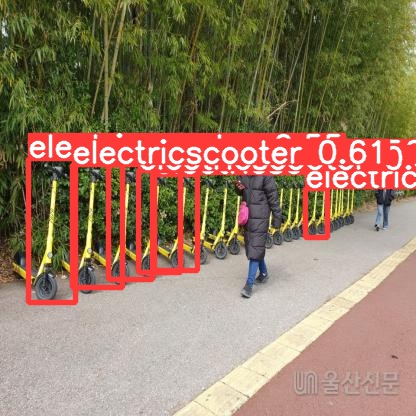

In [57]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp/*.jpg'))
display(Image(filename=image_name))

# 모델 내보내기

In [58]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [59]:
%cp /content/yolov5/runs/train/es_results4/weights/best.pt /content/gdrive/MyDrive/yolov5_sidewalk/best_es_500.pt

mkdir: cannot create directory ‘/content/gdrive/Mydrive/pothole’: No such file or directory
